# Project 2 — Part 5: Multi‑Plane + Portal360 (Step‑by‑step)

המחברת הזאת מציגה את שלב 5 לפי שלבים על **פריים יחיד** (וגם אופציונלי סריקה):

1. טעינת קבצי קלט (וידאו, 3 רפרנסים, 3 פנורמות 360)
2. חישוב features בפריים
3. לכל מישור:
   - Matching + Homography (RANSAC)
   - ציור המסגרת (Homography quad)
4. Pose (rvec/tvec) דרך `PlaneTracker` (כולל hold + smoothing)
5. יצירת טקסטורת portal360 מהפנורמה (sphere mapping)
6. Warp של הטקסטורה לתוך הפורטל + מסגרת אליפטית

שים את המחברת בתוך `augmented-reality-planar/` כדי ש־`from config import ...` יעבוד כמו Parts 1–2.


In [16]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path


def show(img_bgr, title=None, figsize=(12, 8)):
    plt.figure(figsize=figsize)
    if title:
        plt.title(title)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
    plt.show()


def resolve_path(p: str) -> str:
    """Make relative paths work even if the notebook runs from the repo root."""
    pp = Path(p)
    candidates = [pp, Path.cwd() / pp, Path.cwd() / "augmented-reality-planar" / pp]
    for c in candidates:
        try:
            if c.exists():
                return str(c)
        except Exception:
            pass
    return str(pp)


def ratio_test(knn_pairs, ratio: float):
    good = []
    for p in knn_pairs:
        if len(p) < 2:
            continue
        m, n = p[0], p[1]
        if m.distance < float(ratio) * n.distance:
            good.append(m)
    return good



In [17]:
from config import Part5Config, get_camera_params_from_config

cfg = Part5Config()

FRAME_IDX = 0

video_path = resolve_path(cfg.video_path)
ref_paths = [resolve_path(cfg.reference1_path), resolve_path(cfg.reference2_path), resolve_path(cfg.reference3_path)]
env_paths = [resolve_path(cfg.env1_360_path), resolve_path(cfg.env2_360_path), resolve_path(cfg.env3_360_path)]

print("video:", video_path)
print("refs:", ref_paths)
print("envs:", env_paths)
print("feature:", cfg.feature_type)
print("portal_shape:", cfg.portal_shape)



video: data\multi_plane_video.mp4
refs: ['data\\reference1.JPG', 'data\\reference2.JPG', 'data\\reference3.JPG']
envs: ['data\\env1_360.jpg', 'data\\env2_360.jpg', 'data\\env3_360.jpg']
feature: SIFT
portal_shape: ellipse


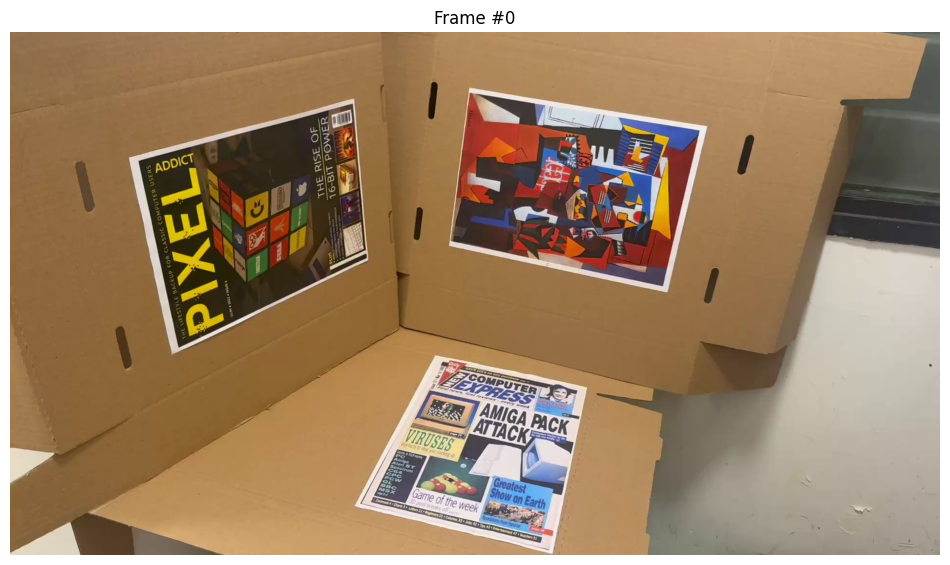

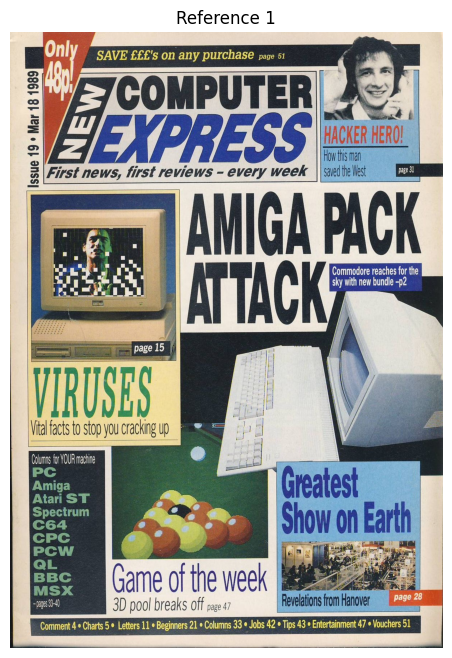

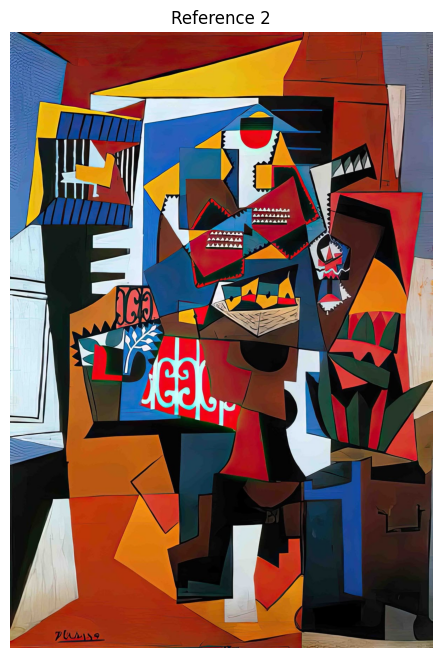

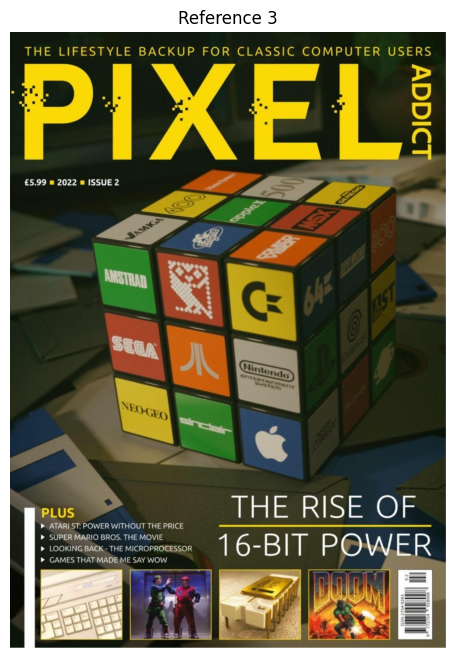

frame size: (1920, 1080)


In [18]:
# Load data
refs = [cv2.imread(p) for p in ref_paths]
envs = [cv2.imread(p) for p in env_paths]

assert all(r is not None for r in refs), "Failed to read one of reference images"
assert all(e is not None for e in envs), "Failed to read one of env panoramas"

cap = cv2.VideoCapture(video_path)
assert cap.isOpened(), f"Failed to open {video_path}"
cap.set(cv2.CAP_PROP_POS_FRAMES, FRAME_IDX)
ok, frame = cap.read()
assert ok, f"Failed to read frame {FRAME_IDX}"

h, w = frame.shape[:2]
K, dist = get_camera_params_from_config((w, h), calib_output_path=cfg.calib_output_path)

show(frame, f"Frame #{FRAME_IDX}")
for i, r in enumerate(refs, start=1):
    show(r, f"Reference {i}")

print("frame size:", (w, h))



In [19]:
# Step 1: frame features (computed once)
feat = str(cfg.feature_type).upper().strip()
if feat == "SIFT":
    det = cv2.SIFT_create()
    norm = cv2.NORM_L2
else:
    det = cv2.ORB_create(nfeatures=2000)
    norm = cv2.NORM_HAMMING

bf = cv2.BFMatcher(norm, crossCheck=False)

fr_gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
kp_fr, des_fr = det.detectAndCompute(fr_gray, None)
print("frame keypoints:", 0 if kp_fr is None else len(kp_fr))



frame keypoints: 5083


Plane 1: good=463
  inliers=229/463


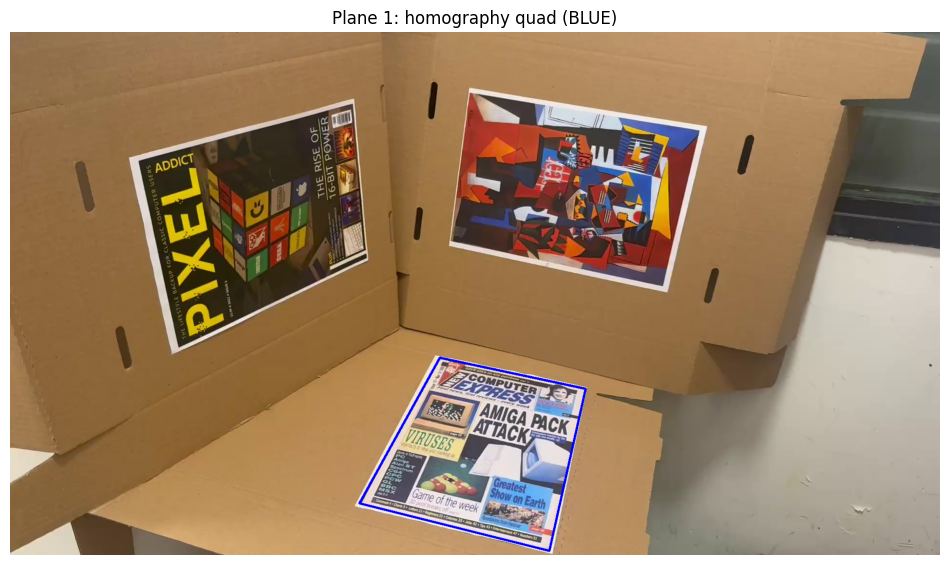

Plane 2: good=300
  inliers=215/300


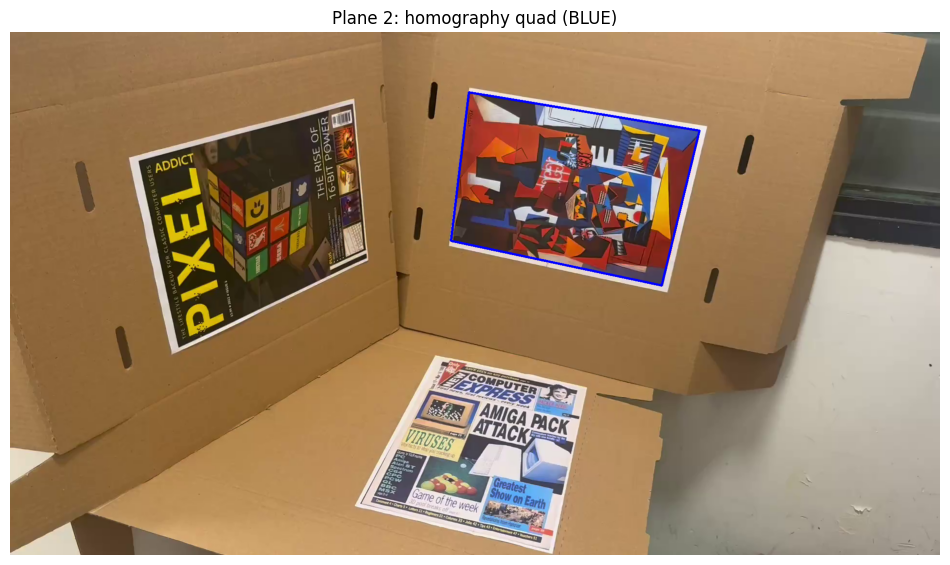

Plane 3: good=396
  inliers=176/396


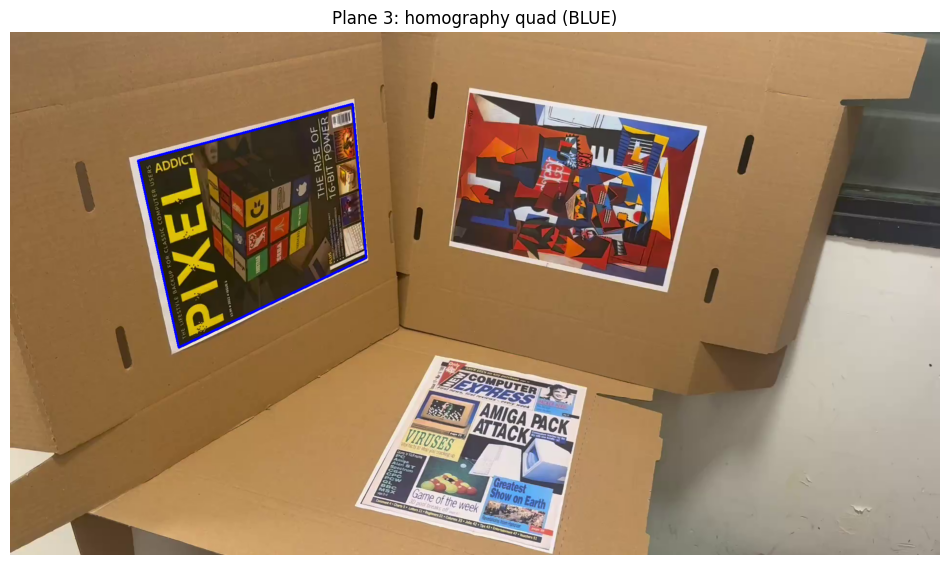

In [20]:
# Step 2+3: per plane matching -> homography -> draw quad (BLUE)

planes_dbg = []

for idx, ref in enumerate(refs, start=1):
    ref_gray = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)
    kp_ref, des_ref = det.detectAndCompute(ref_gray, None)
    hR, wR = ref_gray.shape[:2]

    knn = bf.knnMatch(des_ref, des_fr, k=2)
    good = ratio_test(knn, float(cfg.ratio_test))
    print(f"Plane {idx}: good={len(good)}")
    if len(good) < int(cfg.min_matches):
        print("  not enough matches")
        continue

    src = np.float32([kp_ref[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst = np.float32([kp_fr[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    H, inlier_mask = cv2.findHomography(src, dst, cv2.RANSAC, float(cfg.ransac_reproj_thresh))
    if H is None or inlier_mask is None:
        print("  H failed")
        continue

    inl = int(inlier_mask.sum())
    print(f"  inliers={inl}/{len(good)}")
    if inl < int(cfg.min_inliers):
        print("  too few inliers")
        continue

    ref_corners = np.float32([[0,0],[wR-1,0],[wR-1,hR-1],[0,hR-1]]).reshape(-1,1,2)
    quad = cv2.perspectiveTransform(ref_corners, H).reshape(4,2)

    vis = frame.copy()
    cv2.polylines(vis, [quad.astype(int).reshape(-1,1,2)], True, (255,0,0), 3)
    show(vis, f"Plane {idx}: homography quad (BLUE)")

    planes_dbg.append((idx, (wR, hR), H, inlier_mask, src, dst, quad))




Plane 1
good matches=463


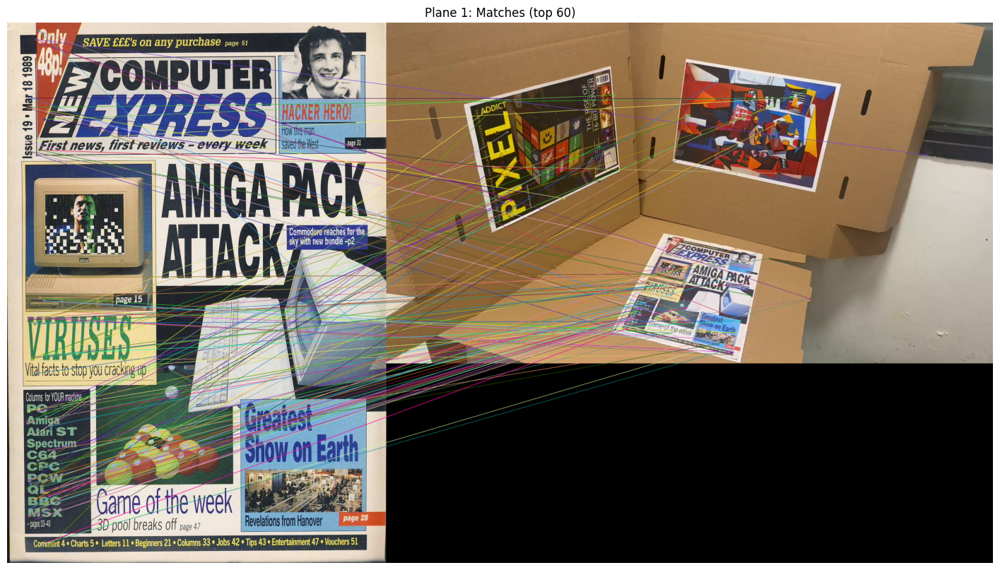

inliers=229/463
H (ref -> frame):
 [[ 2.19216320e-01 -1.98412394e-01  8.87380765e+02]
 [ 3.35538177e-02  3.87213895e-02  6.73504669e+02]
 [-2.65357375e-05 -1.40376169e-04  1.00000000e+00]]


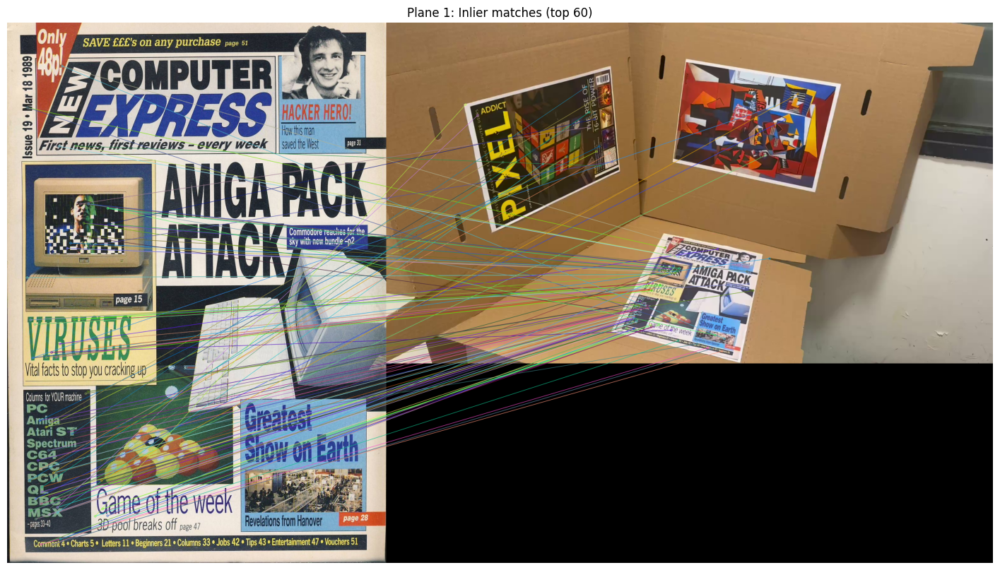

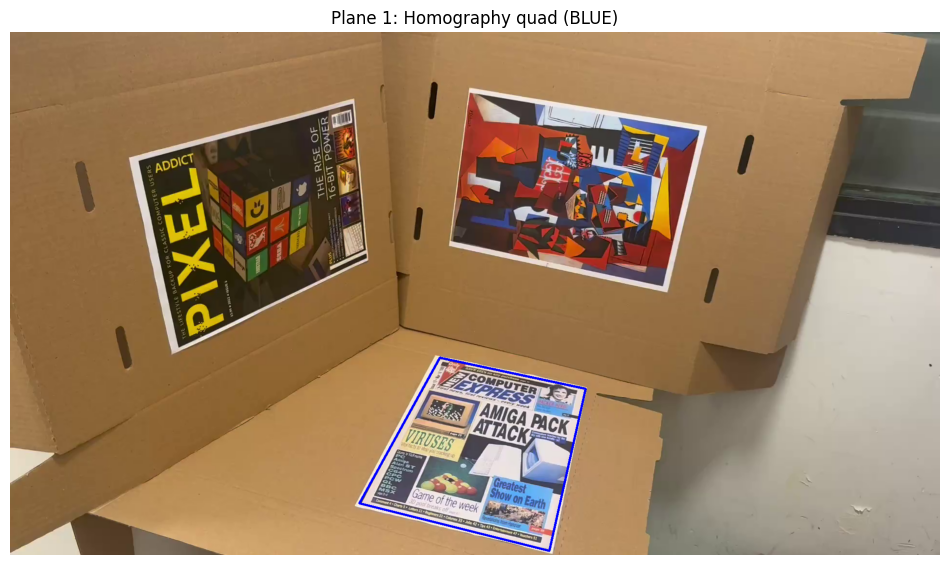

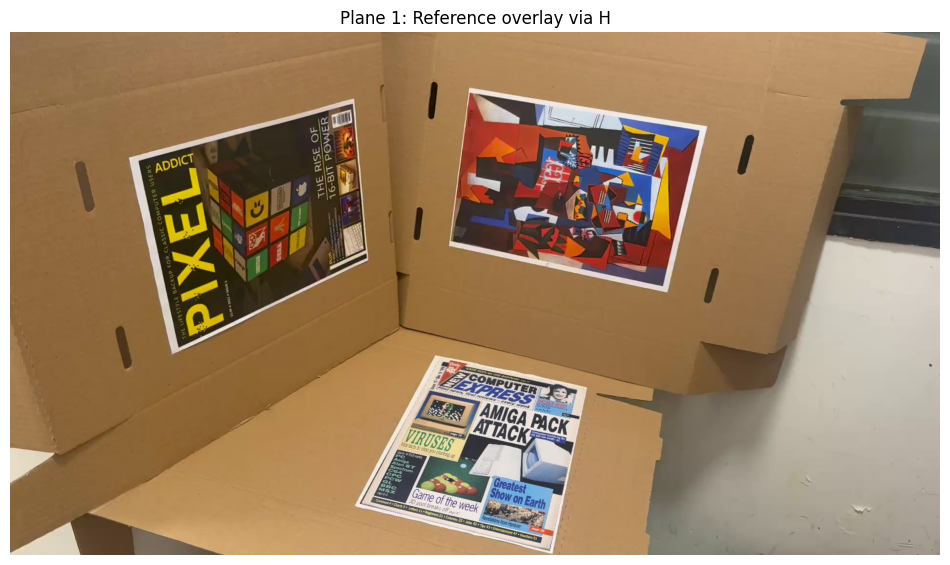


Plane 2
good matches=300


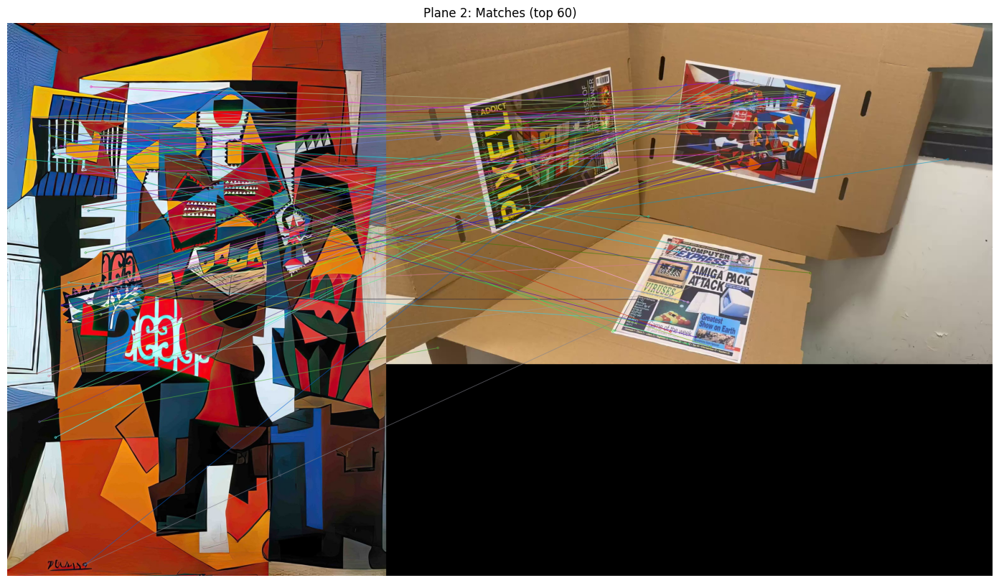

inliers=215/300
H (ref -> frame):
 [[ 3.10996645e-02 -2.34095116e-01  1.42337895e+03]
 [ 3.03725390e-01 -3.99167025e-02  2.05398220e+02]
 [ 7.11281189e-05  3.99118588e-05  1.00000000e+00]]


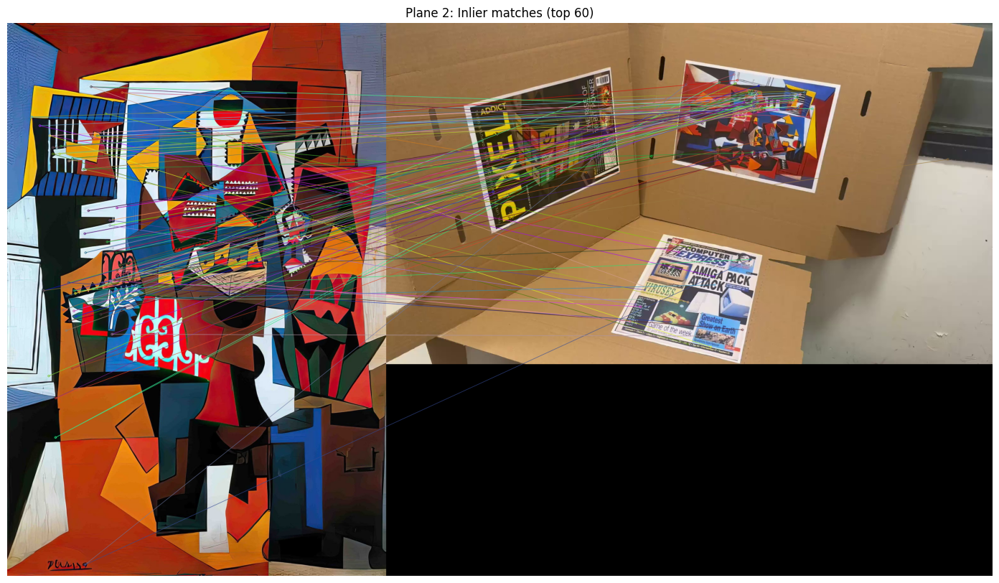

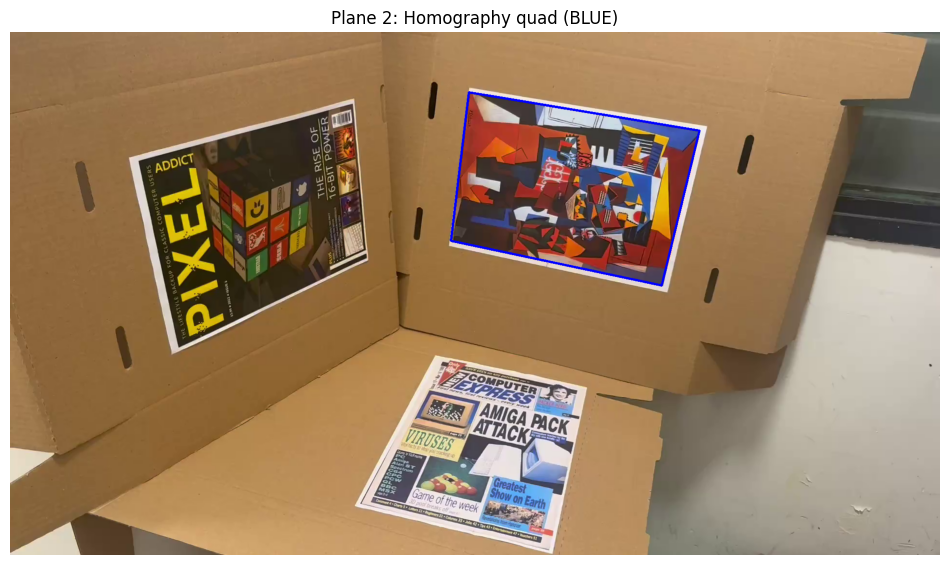

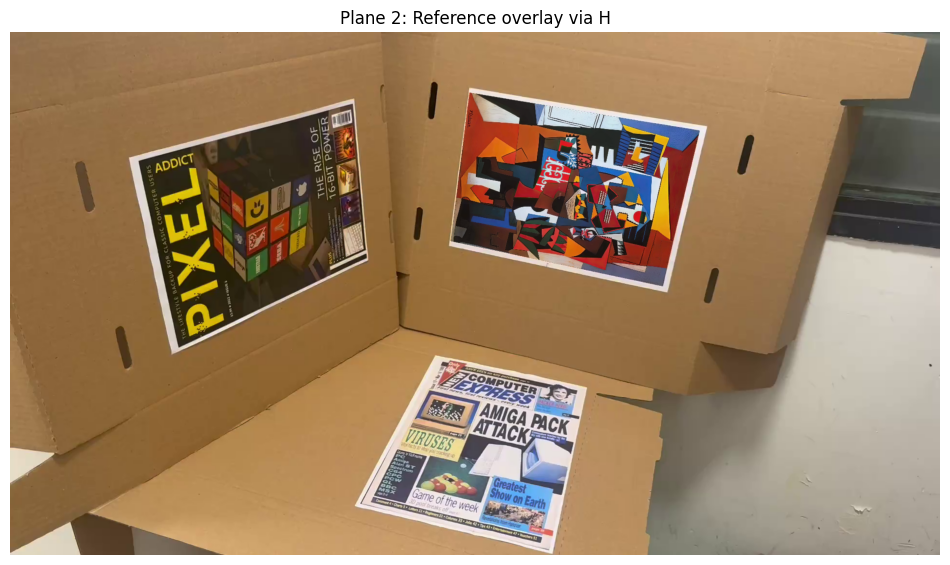


Plane 3
good matches=396


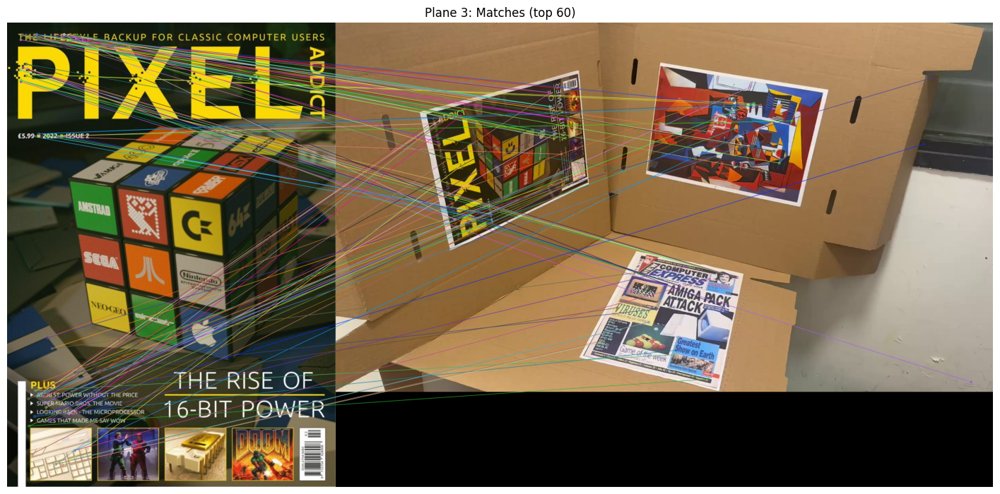

inliers=176/396
H (ref -> frame):
 [[-1.17333219e-01  4.22343361e-01  3.48177115e+02]
 [-4.31854667e-01 -4.91868642e-02  6.52471773e+02]
 [-1.13203377e-04  1.85682782e-04  1.00000000e+00]]


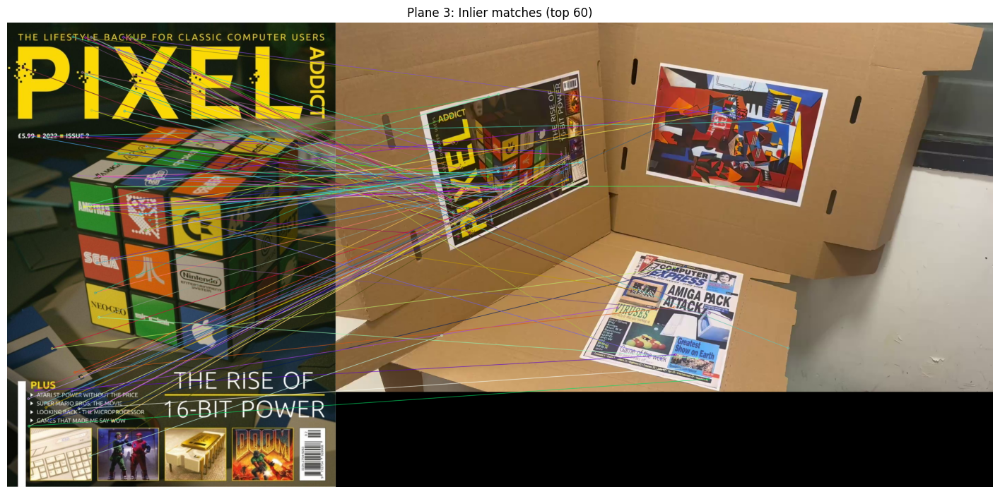

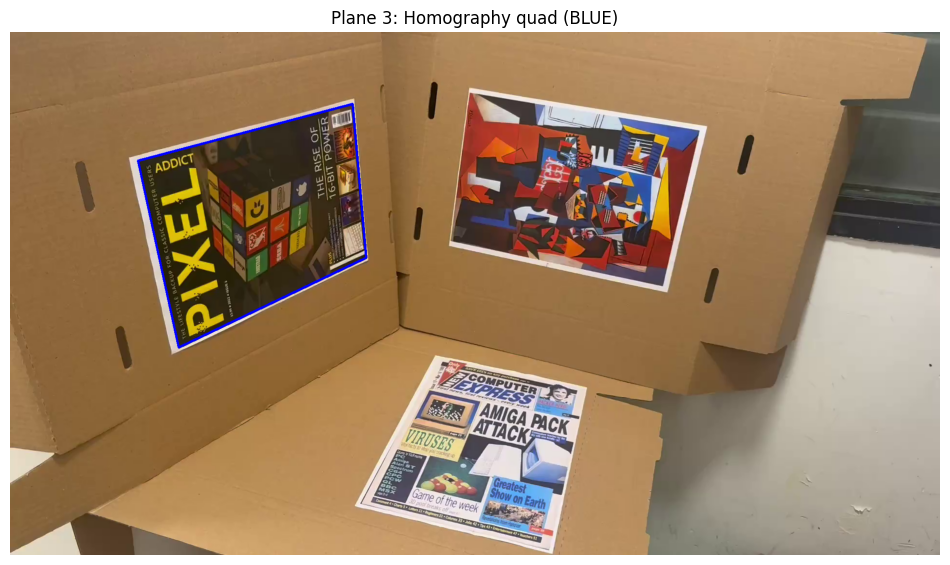

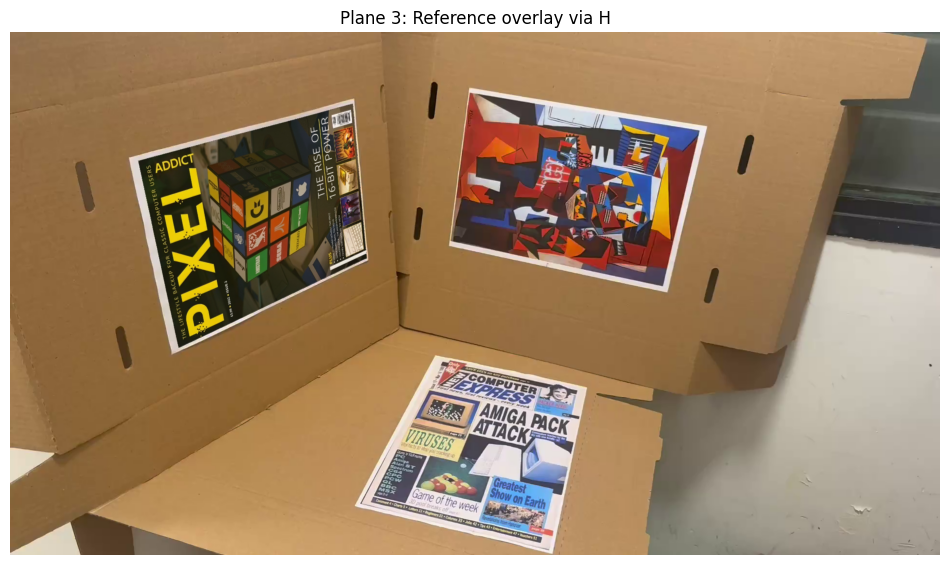

In [21]:
# Step 3 (visual): "Finding the planes" for ALL references
# Shows (per reference): matches -> RANSAC inliers -> H matrix -> quad -> reference overlay via H

MAX_DRAW = 60
OVERLAY_ALPHA = 0.55
SHOW_MATCHES = True

for PLANE_ID in (1, 2, 3):
    print("\n" + "=" * 60)
    print(f"Plane {PLANE_ID}")

    ref = refs[PLANE_ID - 1]
    ref_gray = cv2.cvtColor(ref, cv2.COLOR_BGR2GRAY)
    kp_ref, des_ref = det.detectAndCompute(ref_gray, None)

    pairs = bf.knnMatch(des_ref, des_fr, k=2)

    good_pairs = []
    good = []
    for p in pairs:
        if len(p) < 2:
            continue
        m, n = p[0], p[1]
        if m.distance < float(cfg.ratio_test) * n.distance:
            good_pairs.append([m, n])
            good.append(m)

    print(f"good matches={len(good)}")

    if SHOW_MATCHES:
        mimg = cv2.drawMatchesKnn(
            ref,
            kp_ref,
            frame,
            kp_fr,
            good_pairs[:MAX_DRAW],
            None,
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        )
        show(mimg, f"Plane {PLANE_ID}: Matches (top {min(MAX_DRAW, len(good_pairs))})", figsize=(18, 10))

    if len(good) < int(cfg.min_matches):
        print(f"Not enough matches for homography (need >= {cfg.min_matches})")
        continue

    src = np.float32([kp_ref[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst = np.float32([kp_fr[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    H, inlier_mask = cv2.findHomography(src, dst, cv2.RANSAC, float(cfg.ransac_reproj_thresh))
    if H is None or inlier_mask is None:
        print("Homography failed")
        continue

    inl = inlier_mask.ravel().astype(bool)
    inliers = int(inl.sum())
    print(f"inliers={inliers}/{len(good)}")
    print("H (ref -> frame):\n", H)

    if SHOW_MATCHES:
        inl_pairs = [pr for ok, pr in zip(inl.tolist(), good_pairs) if ok]
        mimg2 = cv2.drawMatchesKnn(
            ref,
            kp_ref,
            frame,
            kp_fr,
            inl_pairs[:MAX_DRAW],
            None,
            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
        )
        show(mimg2, f"Plane {PLANE_ID}: Inlier matches (top {min(MAX_DRAW, len(inl_pairs))})", figsize=(18, 10))

    # Homography quad
    hR, wR = ref_gray.shape[:2]
    ref_corners = np.float32([[0, 0], [wR - 1, 0], [wR - 1, hR - 1], [0, hR - 1]]).reshape(-1, 1, 2)
    quad = cv2.perspectiveTransform(ref_corners, H).reshape(4, 2)

    vis = frame.copy()
    cv2.polylines(vis, [quad.astype(int).reshape(-1, 1, 2)], True, (255, 0, 0), 3)
    show(vis, f"Plane {PLANE_ID}: Homography quad (BLUE)")

    # Warp+overlay reference via H
    hF, wF = frame.shape[:2]
    warped_ref = cv2.warpPerspective(ref, H, (wF, hF))

    ones = np.ones((ref.shape[0], ref.shape[1]), dtype=np.uint8) * 255
    mask = cv2.warpPerspective(ones, H, (wF, hF))

    out = frame.copy()
    idxm = mask > 0
    a = float(OVERLAY_ALPHA)
    out[idxm] = (a * warped_ref[idxm] + (1.0 - a) * out[idxm]).astype(np.uint8)

    show(out, f"Plane {PLANE_ID}: Reference overlay via H")



P1 visible= True held= False good= 463 inliers= 229


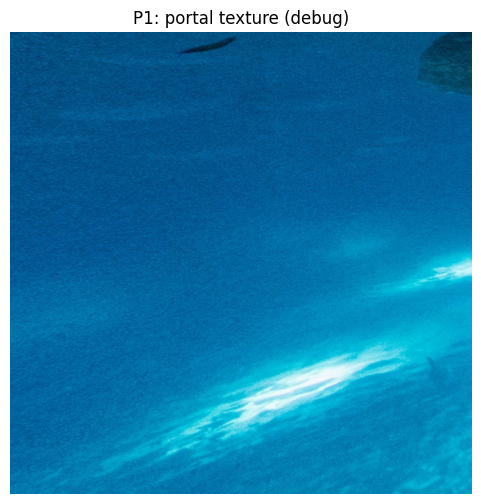

P2 visible= True held= False good= 300 inliers= 215


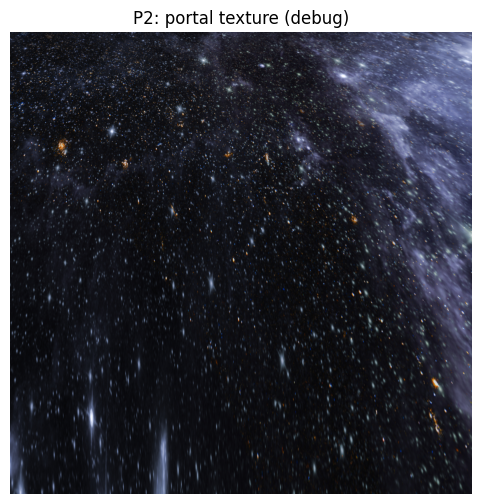

P3 visible= True held= False good= 396 inliers= 176


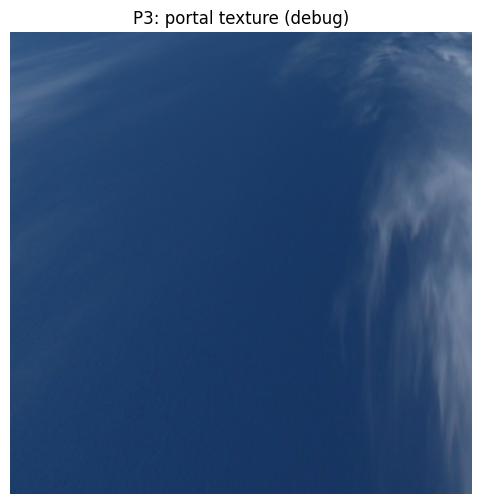

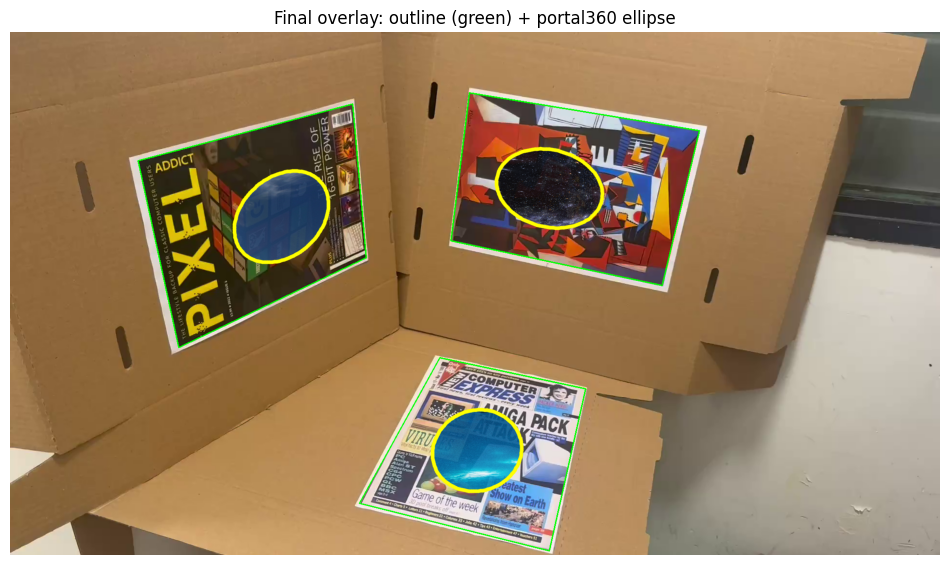

In [22]:
# Step 4-6 using the actual project code (PlaneTracker + portal360)
from multiplane import PlaneTracker, _camera_center_in_object, _render_portal_from_equirect_sphere

# Build PlaneTracker objects (this includes pose smoothing + hold)
trackers = [PlaneTracker("P1", refs[0], cfg), PlaneTracker("P2", refs[1], cfg), PlaneTracker("P3", refs[2], cfg)]

# Reuse frame features: kp_fr/des_fr
out = frame.copy()

for j, tr in enumerate(trackers):
    pose = tr.update_from_frame_features(kp_fr, des_fr, K, dist)
    print(tr.name, "visible=", pose.visible, "held=", pose.held, "good=", tr.good, "inliers=", tr.inliers)
    if not pose.visible:
        continue

    # Outer detection outline (green) = homography quad used for drawing
    quad = tr.last_corners_img()
    if quad is not None:
        cv2.polylines(out, [quad.astype(int).reshape(-1,1,2)], True, (0,255,0), 2)

    # Portal quad in the center
    portal2d = tr.project_portal(pose.rvec, pose.tvec, K, dist)

    # Render portal texture from the matching env panorama
    pano = envs[j]
    C_obj = _camera_center_in_object(pose.rvec, pose.tvec)
    fov = float(getattr(cfg, "portal_env_fov_scale", 1.0))
    tex = _render_portal_from_equirect_sphere(
        pano,
        C_obj,
        portal_w=tr.portal_w * fov,
        portal_h=tr.portal_h * fov,
        out_size=int(getattr(cfg, "portal_tex_size", 384)),
        sphere_radius=float(getattr(cfg, "portal_env_sphere_radius", 20.0)),
    )

    show(tex, f"{tr.name}: portal texture (debug)", figsize=(6, 6))

    # Draw ellipse portal (mask) + warp texture
    ell2d = tr.project_portal_ellipse(pose.rvec, pose.tvec, K, dist)
    if np.isfinite(ell2d).all():
        mask = np.zeros(out.shape[:2], dtype=np.uint8)
        cv2.fillPoly(mask, [np.int32(ell2d).reshape(-1, 1, 2)], 255, lineType=cv2.LINE_AA)

        # Warp texture to portal quad, but blend only inside ellipse mask
        hF, wF = out.shape[:2]
        th, tw = tex.shape[:2]
        srcq = np.float32([[0,0],[tw-1,0],[tw-1,th-1],[0,th-1]])
        dstq = np.asarray(portal2d, dtype=np.float32).reshape(4,2)
        H = cv2.getPerspectiveTransform(srcq, dstq)
        warped = cv2.warpPerspective(tex, H, (wF, hF))

        a = float(cfg.portal_alpha)
        idxm = mask > 0
        out[idxm] = (a * warped[idxm] + (1.0 - a) * out[idxm]).astype(np.uint8)

        # Ellipse border
        cv2.polylines(out, [np.int32(ell2d).reshape(-1, 1, 2)], True, cfg.portal_border_bgr, int(cfg.portal_border_thickness), cv2.LINE_AA)

show(out, "Final overlay: outline (green) + portal360 ellipse")



In [23]:
# Optional: scan for a better FRAME_IDX (lightweight)
# Finds a frame where the sum of inliers across planes is maximized.

STEP = 30
MAX_FRAMES = 900

cap2 = cv2.VideoCapture(video_path)
assert cap2.isOpened()

best = (-1, -1)  # (score, frame_idx)

for i in range(0, MAX_FRAMES, STEP):
    cap2.set(cv2.CAP_PROP_POS_FRAMES, i)
    ok, fr = cap2.read()
    if not ok:
        break

    g = cv2.cvtColor(fr, cv2.COLOR_BGR2GRAY)
    kp, des = det.detectAndCompute(g, None)

    score = 0
    for tr, ref in zip(trackers, refs):
        # quick: reuse PlaneTracker logic
        pose = tr.update_from_frame_features(kp, des, K, dist)
        if pose.visible:
            score += int(tr.inliers)

    if score > best[0]:
        best = (score, i)

cap2.release()
print("best score, frame:", best)



best score, frame: (1388, 840)
